# Vector Data

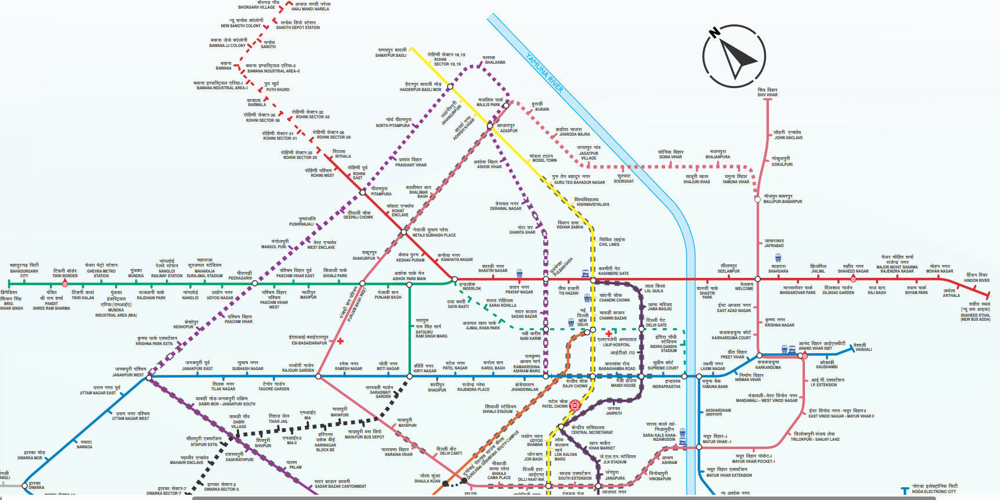

Vector data represent objects on the Earth's surface using their longitude and latitude, as well as combinations of the pairs of coordinates (lines, polylines, polygons, etc.).

<b>Point data</b>

A pair of coordinates (longitude, latitude), that represents the location of points on the Earth's surface.

Example: Location of drop boxes, landmarks, etc.

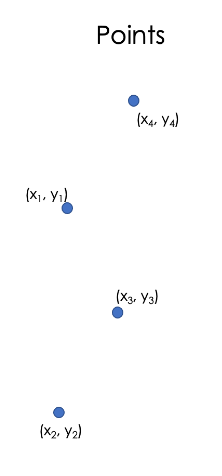

<b>Lines</b>

A series of points that represents a line (straight or otherwise) on the Earth's surface.

Example: Center of roads, rivers, etc.

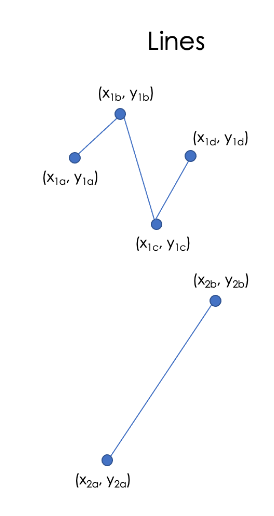

<b>Polygons</b>
A series of points (vertices) that define the outer edge of a region. Example: Outlines of cities, countries, continents, etc.

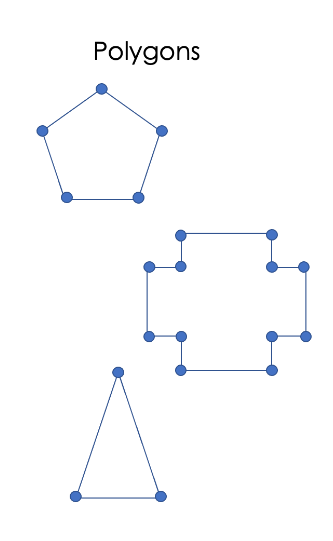

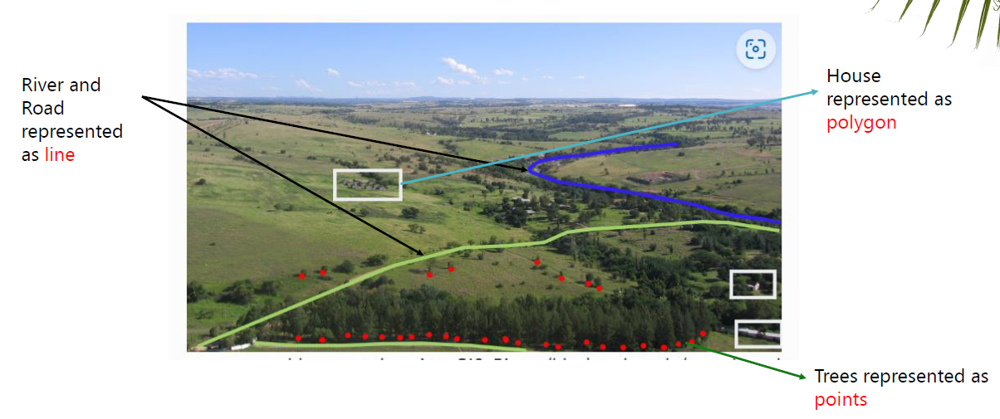

<b> Credits:</b>
* **Google Earth** https://developers.google.com/earth-engine/tutorials/community/beginners-cookbook.
* **GeoPandas Tutorial** http://http://geopandas.org/


# Introduction to Pandas

**Learning Objectives:**
  * Gain an introduction to the `DataFrame` and `Series` data structures of the *pandas* library
  * Access and manipulate data within a `DataFrame` and `Series`
  * Import CSV data into a *pandas* `DataFrame`


pandas is an open source, BSD-licensed library providing high-performance, easy-to-use data structures and data analysis tools for the Python programming language.

[*pandas*](http://pandas.pydata.org/) is a column-oriented data analysis python library. It's a great tool for handling and analyzing input data.

# Pandas Basics

The primary data structures in *pandas* are implemented as two classes:

  * **`DataFrame`**, which you can imagine as a relational data table, with rows and named columns.
  * **`Series`**, which is a single column. A `DataFrame` contains one or more `Series` and a name for each `Series`.

The data frame is a commonly used abstraction for data manipulation.

In [ ]:
import pandas as pd
import os
import shapely
os.chdir(r'/content/drive/MyDrive/DLP_Data/India')

One way to create a `Series` is to construct a `Series` object by passing a list of values. For example:

In [ ]:
pd.Series(['Dehradun','Almora','Pithoragarh'])

,0
0,Dehradun
1,Almora
2,Pithoragarh


`DataFrame` objects can be created by passing a `dict` mapping `string` column names to their respective `Series`.

In [ ]:
city_names = pd.Series(['Dehradun','Almora','Pithoragarh'])
population = pd.Series([10000,200000,3000000])

In [ ]:
pd.DataFrame({ 'City Name': city_names, 'Population': population })

,City Name,Population
0,Dehradun,10000
1,Almora,200000
2,Pithoragarh,3000000


# Reading csv File

In [ ]:
file_name = 'stations.csv'

In [ ]:
df = pd.read_csv('stations.csv')

In [ ]:
df

,STATION ID,STATION,NAME OF STATION,Latitude,Longitude
0,46807982,CHAKRATA,AIS-CRTA,30.7047,77.8622
1,468087D4,LAKHAMANDAL,AQI-LMDL,30.7319,78.0739
2,46808906,KALSI,AQI-KLSI,30.5386,77.8519
3,468094A2,NAGTHAT,AQI-NGTH,30.3811,78.0236
4,46809A70,KOTI,AQI-KOTI,30.6450,77.8542
...,...,...,...,...,...
147,46857090,HARIDWAR,AQI-HDWR,29.9522,78.1628
148,46815D94,KALAGARH,AQI-KGAR,29.4886,78.7603
149,46846FCE,JHULAGHAT,AWI-JLGT,29.5728,80.3831
150,4680D7A8,SAHASTRADHARA (HELIPAD)GIC/ITI,AWI-SDRA,30.3822,78.1311


The example above used `DataFrame.describe` to show interesting statistics about a `DataFrame`. Another useful function is `DataFrame.head`, and `DataFrame.tail` which displays the first few records of a `DataFrame`:

In [ ]:
df.describe()

,Latitude,Longitude
count,152.000000,152.000000
mean,30.046873,79.085942
std,0.543012,0.772759
min,28.882800,77.775800
25%,29.694600,78.384975
50%,30.017100,79.083750
75%,30.456700,79.628025
max,31.150600,80.852500


In [ ]:
df.head()

,STATION ID,STATION,NAME OF STATION,Latitude,Longitude
0,46807982,CHAKRATA,AIS-CRTA,30.7047,77.8622
1,468087D4,LAKHAMANDAL,AQI-LMDL,30.7319,78.0739
2,46808906,KALSI,AQI-KLSI,30.5386,77.8519
3,468094A2,NAGTHAT,AQI-NGTH,30.3811,78.0236
4,46809A70,KOTI,AQI-KOTI,30.6450,77.8542


In [ ]:
df.tail()

,STATION ID,STATION,NAME OF STATION,Latitude,Longitude
147,46857090,HARIDWAR,AQI-HDWR,29.9522,78.1628
148,46815D94,KALAGARH,AQI-KGAR,29.4886,78.7603
149,46846FCE,JHULAGHAT,AWI-JLGT,29.5728,80.3831
150,4680D7A8,SAHASTRADHARA (HELIPAD)GIC/ITI,AWI-SDRA,30.3822,78.1311
151,46807750,CHAKRATA,AQI-CRTA,30.7047,77.8622


## Accessing Data

You can access `DataFrame` data using familiar Python dict/list operations:

In [ ]:
df['STATION ID']

,STATION ID
0,46807982
1,468087D4
2,46808906
3,468094A2
4,46809A70
...,...
147,46857090
148,46815D94
149,46846FCE
150,4680D7A8


In [ ]:
df['STATION ID'][2]

'46808906'

In [ ]:
df['STATION ID'][4:8]

,STATION ID
4,46809A70
5,4680A138
6,4680AFEA
7,4680B24E


In [ ]:
df[df['STATION']=='NAGTHAT']

,STATION ID,STATION,NAME OF STATION,Latitude,Longitude
3,468094A2,NAGTHAT,AQI-NGTH,30.3811,78.0236


## Manipulating Data

You may apply Python's basic arithmetic operations to `Series`. For example:

In [ ]:
df['Lat in Min'] = df['Latitude']*60

## Indexes
Both `Series` and `DataFrame` objects also define an `index` property that assigns an identifier value to each `Series` item or `DataFrame` row.

By default, at construction, *pandas* assigns index values that reflect the ordering of the source data. Once created, the index values are stable; that is, they do not change when data is reordered.

In [ ]:
df['STATION ID'].index

RangeIndex(start=0, stop=152, step=1)

`DataFrame.reindex` to  reorders the rows. For example

In [ ]:
df['STATION ID'].reindex([2, 0, 1])

,STATION ID
2,46808906
0,46807982
1,468087D4


`DataFrame.sort_values` to  sort the rows by one or more columns. For example

In [ ]:
df.sort_values(by=['Latitude'])

,STATION ID,STATION,NAME OF STATION,Latitude,Longitude,Lat in Min
77,468482EE,KHATIMA,AQI-KHTM,28.8828,79.9208,1732.968
78,46849198,KICHHA,AWI-KCHA,28.9089,79.5094,1734.534
146,46858EC6,RUDRAPUR,AQI-RUPR,28.9769,79.3928,1738.614
82,4684B774,GULAR BHOJ,AWI-GRBJ,29.0414,79.2475,1742.484
81,4684AAD0,GADARPUR,AWI-GDPR,29.0414,79.2475,1742.484
...,...,...,...,...,...,...
20,468001C0,MORI,AQI-MORI,31.0214,78.0467,1861.284
27,468042CA,HARSIL,AIS-HSIL,31.0372,78.7544,1862.232
26,46803A88,HARSIL,AQI-HSIL,31.0372,78.7544,1862.232
22,468012B6,NAITWAR,AQI-NWAR,31.0700,78.1000,1864.200


# Introduction to Geo Pandas

**Learning Objectives:**
  * Gain an introduction to the `GeoDataFrame` and `GeoSeries` data structures of the *geopandas* library
  * Access and manipulate data within a `GeoDataFrame` and `GeoSeries`
  * Reading Vector Data
  * Manipulating Vector Data
  * Processing Vector data
  * Writing Vector Data
  

# GeoPandas Basics

`GeoPandas` is an open source project to make working with geospatial data in python easier. GeoPandas extends the datatypes used by pandas to allow `spatial operations` on geometric types.

The primary data structures in *geopandas* are implemented as two classes:

  * **`GeoSeries`**, is essentially a vector where each entry in the vector is a set of shapes corresponding to one observation. *Geopandas** has three basic classes of geometric objects:

    * Points / Multi-Points
    * Lines / Multi-Lines
    * Polygons / Multi-Polygons

  

* **`GeoDataFrame`**, is a tabular data structure that contains a *GeoSeries*.The most important property of a *GeoDataFrame* is that it always has one *GeoSeries* column that holds a special status. This GeoSeries is referred to as the GeoDataFrame’s **“geometry”**.

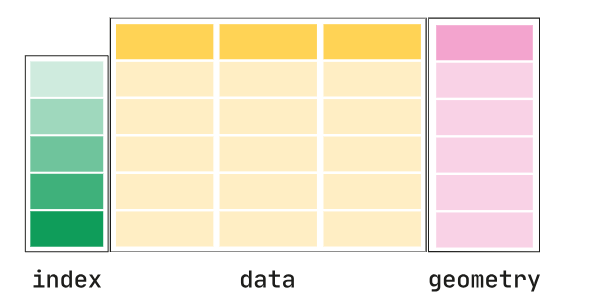

# Reading and Writing Spatial  Data

# Vector Data Formats

**`ESRI Sahpe File`** is simple, nontopological format for storing the geometric location and attribute information of geographic features.The shapefile format defines the geometry and attributes of geographically referenced features in three or more files with specific file extensions:
 * .shp—The main file that stores the feature geometry; required.
 * .shx—The index file that stores the index of the feature geometry; required.
 * .dbf—The dBASE table that stores the attribute information of features; required.
 * .sbn and .sbx—The files that store the spatial index of the features.
 * .prj—The file that stores the coordinate system information


**`GeoJSON`** GeoJSON is a format for encoding a variety of geographic data structures.A *GeoJSON* object may represent a region of space (a Geometry), a spatially bounded entity (a Feature), or a list of Features (a FeatureCollection). GeoJSON supports the following geometry types: Point, LineString, Polygon, MultiPoint, MultiLineString, MultiPolygon, and GeometryCollection. Features in GeoJSON contain a Geometry object and additional properties, and a FeatureCollection contains a list of Features.


 {
  "type": "Feature",
  
  "geometry": {
    
    "type": "Point",
    "coordinates": [78, 30]
  },
  
  "properties": {
    "name": "Dehradun"
  }

}

**`Geography Markup Language`**

**`Keyhole Markup Language`**

**`MongoDB`**

**`Microsoft SQL Server Spatial Database`**

**`OGC WFS service`**

**`etc.`**

# Reading Shape File

In [ ]:
!pip uninstall geopandas

Found existing installation: geopandas 1.0.1
Uninstalling geopandas-1.0.1:
  Would remove:
    /usr/local/lib/python3.11/dist-packages/geopandas-1.0.1.dist-info/*
    /usr/local/lib/python3.11/dist-packages/geopandas/*
Proceed (Y/n)? y
  Successfully uninstalled geopandas-1.0.1


In [ ]:
!pip install geopandas
!pip install mapclassify

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 3.7 MB/s eta 0:00:00


In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from geopandas import GeoSeries

In [ ]:
gpd.__version__

'1.0.1'

In [ ]:
vector_file = 'STATE_BOUNDARY.shp'

In [ ]:
india = gpd.read_file(vector_file)

In [ ]:
type(india)

geopandas.geodataframe.GeoDataFrame

In [ ]:
india.geometry.name

'geometry'

In [ ]:
india.crs

<Projected CRS: PROJCS["LCC_WGS84",GEOGCS["WGS 84",DATUM["WGS_1984 ...>
Name: LCC_WGS84
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Lambert Conic Conformal (2SP)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Renaming a Column

In [ ]:
india = india.rename(columns={'geometry': 'borders'}).set_geometry('borders')

In [ ]:
india.head()

,STATE,State_LGD,Shape_Leng,Shape_Area,borders
0,ANDAMAN & NICOBAR,35,5.824763e+06,7.837276e+09,"MULTIPOLYGON (((5575271.419 2199389.821, 55752..."
1,ANDHRA PRADESH,28,5.334647e+06,1.599742e+11,"POLYGON ((4484061.304 3482639.72, 4484153.303 ..."
2,ARUN>CHAL PRADESH,12,2.618522e+06,7.933917e+10,"POLYGON ((5541236.369 4673135.89, 5543000.102 ..."
3,ASSAM,18,3.228020e+06,7.554956e+10,"POLYGON ((5310055.311 4167338.817, 5310055.27 ..."
4,BIH>R,10,2.980745e+06,9.061637e+10,"POLYGON ((4398747.075 4388549.516, 4398767.518..."


<Axes: >

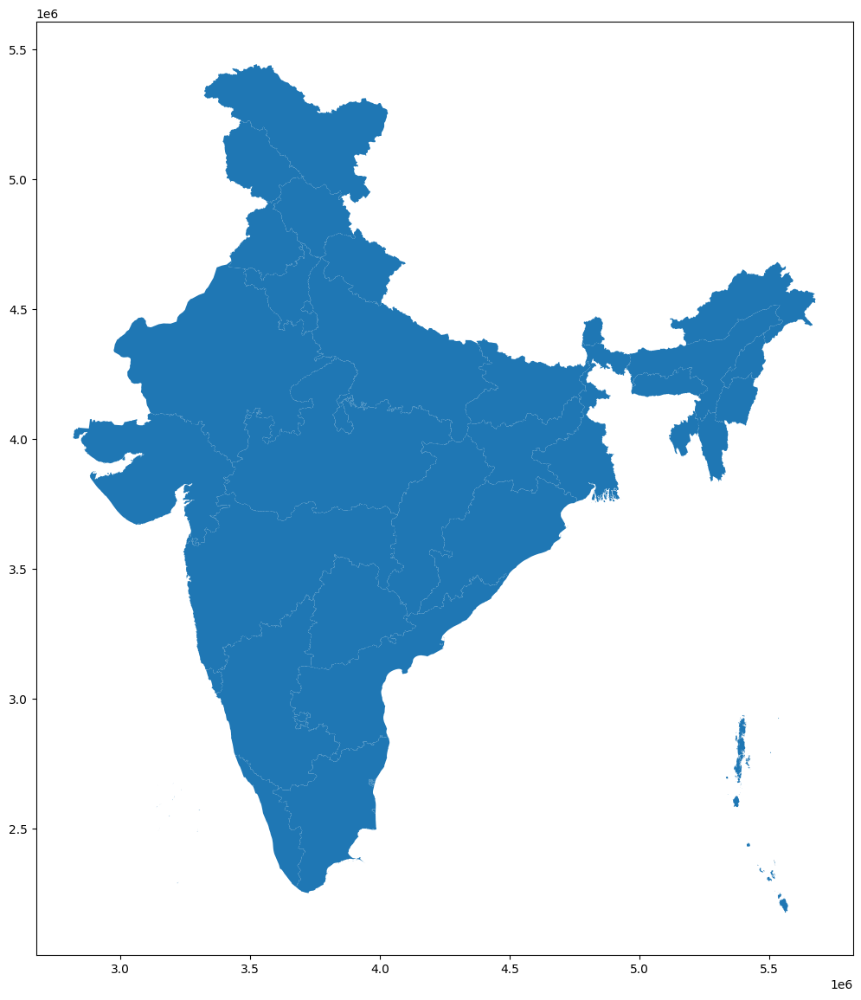

In [ ]:
india.plot(figsize=(18, 14))

# Reading Shape File(.zip)

In [ ]:
vector_file = r'/content/drive/MyDrive/DLP_Data/India/STATE_BOUNDARY.zip'

In [ ]:
states = gpd.read_file(vector_file)

In [ ]:
states

,STATE,State_LGD,Shape_Leng,Shape_Area,geometry
0,ANDAMAN & NICOBAR,35,5.824763e+06,7.837276e+09,"MULTIPOLYGON (((5575271.419 2199389.821, 55752..."
1,ANDHRA PRADESH,28,5.334647e+06,1.599742e+11,"POLYGON ((4484061.304 3482639.72, 4484153.303 ..."
2,ARUN>CHAL PRADESH,12,2.618522e+06,7.933917e+10,"POLYGON ((5541236.369 4673135.89, 5543000.102 ..."
3,ASSAM,18,3.228020e+06,7.554956e+10,"POLYGON ((5310055.311 4167338.817, 5310055.27 ..."
4,BIH>R,10,2.980745e+06,9.061637e+10,"POLYGON ((4398747.075 4388549.516, 4398767.518..."
5,CHAND|GARH,4,6.211308e+04,1.118674e+08,"POLYGON ((3694950.413 4743456.292, 3695003.147..."
6,CHHAtT|SGARH,22,3.321743e+06,1.303554e+11,"POLYGON ((4333553.849 4014543.427, 4333728.26 ..."
7,D>DRA & NAGAR HAVELI & DAM>N & DIU,38,3.215824e+05,5.797731e+08,"MULTIPOLYGON (((3278305.843 3619549.074, 32784..."
8,DELHI,7,2.348592e+05,1.437689e+09,"POLYGON ((3721508.765 4532652.788, 3721586.729..."
9,DISPUTED (MADHYA PRADESH & GUJAR>T),0,1.806306e+04,4.222065e+06,"MULTIPOLYGON (((3413880.67 3832259.287, 341391..."


<Axes: >

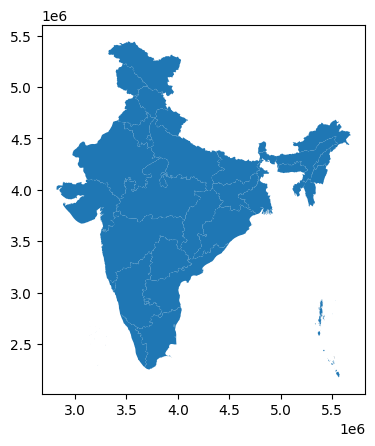

In [ ]:
states.plot()

# Reading Shape File from inside (.zip)
If the dataset is in a file  in the ZIP file or there are multiple shape files in zip folder , you have to append its name

In [ ]:
vector_file = r'Administrative_Boundary_Database.zip!MAJOR_TOWNS.shp'

In [ ]:
india = gpd.read_file(vector_file)

In [ ]:
india.head()

,Rotation,Scale,name_of_to,district,state,ELEVATION,geometry
0,0,0.0,SUKHANI,KISHANGANJ,BIHAR,0,POINT (4784548.237 4277990.025)
1,0,0.0,KANKIP,KISHANGANJ,BIHAR,0,POINT (4769647.933 4239679.589)
2,0,0.0,MATHURAPUR,KATIHAR,BIHAR,0,POINT (4791108.052 4190938.903)
3,0,0.0,KHUSROPUR,PATNA,BIHAR,0,POINT (4532344.822 4168999.486)
4,0,0.0,SARAI,SHEIKHPURA,BIHAR,0,POINT (4588785.384 4136318.903)


<Axes: >

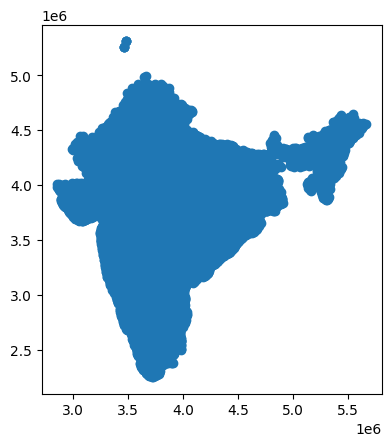

In [ ]:
india.plot()

In [ ]:
plt.close()

# Reading file from Web URL
GeoPandas can also load resources directly from a web URL, for example for GeoJSON files from geojson.xyz

In [ ]:
url = "http://d2ad6b4ur7yvpq.cloudfront.net/naturalearth-3.3.0/ne_110m_land.geojson"
gdf = gpd.read_file(url)

In [ ]:
gdf

,scalerank,featureclass,geometry
0,1,Country,"POLYGON ((-59.57209 -80.04018, -59.86585 -80.5..."
1,1,Country,"POLYGON ((-159.20818 -79.49706, -161.1276 -79...."
2,1,Country,"POLYGON ((-45.15476 -78.04707, -43.92083 -78.4..."
3,1,Country,"POLYGON ((-121.21151 -73.50099, -119.91885 -73..."
4,1,Country,"POLYGON ((-125.55957 -73.48135, -124.03188 -73..."
...,...,...,...
122,1,Country,"POLYGON ((51.13619 80.54728, 49.79368 80.41543..."
123,1,Country,"POLYGON ((99.93976 78.88094, 97.75794 78.7562,..."
124,1,Country,"POLYGON ((-87.02 79.66, -85.81435 79.3369, -87..."
125,1,Country,"POLYGON ((-68.5 83.10632, -65.82735 83.02801, ..."


<Axes: >

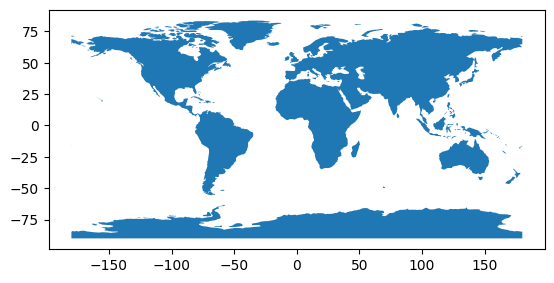

In [ ]:
gdf.plot()

In [ ]:
india.head()

,Rotation,Scale,name_of_to,district,state,ELEVATION,geometry
0,0,0.0,SUKHANI,KISHANGANJ,BIHAR,0,POINT (4784548.237 4277990.025)
1,0,0.0,KANKIP,KISHANGANJ,BIHAR,0,POINT (4769647.933 4239679.589)
2,0,0.0,MATHURAPUR,KATIHAR,BIHAR,0,POINT (4791108.052 4190938.903)
3,0,0.0,KHUSROPUR,PATNA,BIHAR,0,POINT (4532344.822 4168999.486)
4,0,0.0,SARAI,SHEIKHPURA,BIHAR,0,POINT (4588785.384 4136318.903)


In [ ]:
india['state'].unique()

array(['BIHAR', 'WEST BENGAL', 'UTTAR PRADESH', 'MADHYA PRADESH', None,
       'RAJASTHAN', 'CHHATTISGARH', 'MAHARASHTRA', 'ANDHRA PRADESH',
       'JHARKHAND', 'SIKKIM', 'UTTARAKHAND', 'HIMACHAL PRADESH', 'PUNJAB',
       'HARYANA', 'DELHI', 'TELANGANA', 'ODISHA', 'KARNATAKA', 'GUJARAT',
       'DAMAN & DIU', 'GOA', 'DADRA & NAGAR HAVELI', 'TAMIL NADU',
       'KERALA', 'PUDUCHERRY', 'ASSAM', 'MIZORAM', 'TRIPURA', 'MANIPUR',
       'MEGHALAYA', 'NAGALAND', 'ARUNACHAL PRADESH', 'LADAKH'],
      dtype=object)

# Reading Subset of Data

# Geometry filter
The geometry filter only loads data that intersects with the geometry.

In [ ]:
gdf_mask = gpd.read_file('STATE_BOUNDARY.shp')

In [ ]:
gdf_mask.head()

,STATE,State_LGD,Shape_Leng,Shape_Area,geometry
0,ANDAMAN & NICOBAR,35,5.824763e+06,7.837276e+09,"MULTIPOLYGON (((5575271.419 2199389.821, 55752..."
1,ANDHRA PRADESH,28,5.334647e+06,1.599742e+11,"POLYGON ((4484061.304 3482639.72, 4484153.303 ..."
2,ARUN>CHAL PRADESH,12,2.618522e+06,7.933917e+10,"POLYGON ((5541236.369 4673135.89, 5543000.102 ..."
3,ASSAM,18,3.228020e+06,7.554956e+10,"POLYGON ((5310055.311 4167338.817, 5310055.27 ..."
4,BIH>R,10,2.980745e+06,9.061637e+10,"POLYGON ((4398747.075 4388549.516, 4398767.518..."


In [ ]:
file_name = 'DISTRICT_BOUNDARY.shp'

In [ ]:
df = gpd.read_file(file_name, mask=gdf_mask[gdf_mask.STATE=="ASSAM"],)

<Axes: >

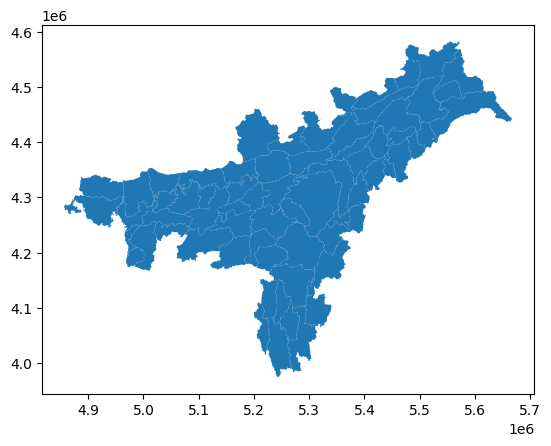

In [ ]:
df.plot()

# Bounding box filter

In [ ]:
bbox = (4.9e6, 4e6, 5.4e6, 4.2e6)
gdf = gpd.read_file(file_name,bbox=bbox)

<Axes: >

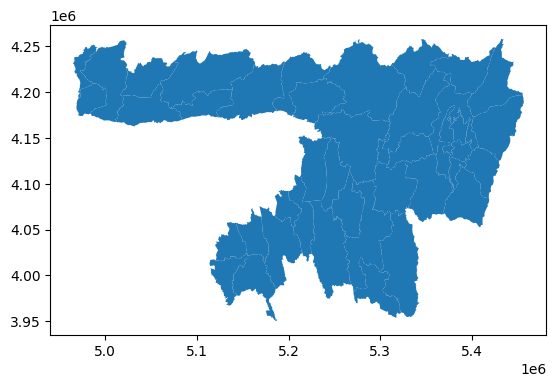

In [ ]:
gdf.plot()

# Row filter  
Filter the rows loaded in from the file using an integer (for the first n rows) or a slice object.

In [ ]:
gdf = gpd.read_file(file_name,rows=slice(80, 180))

<Axes: >

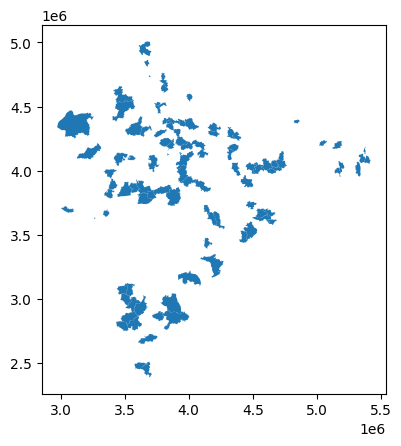

In [ ]:
gdf.plot()

# Field/column filters
Load in a subset of fields from the file using the columns keyword

In [ ]:
gdf = gpd.read_file(file_name, columns=["STATE"])

In [ ]:
gdf.head()

,District,STATE,REMARKS,State_LGD,DISTRICT_L,Shape_Leng,Shape_Area,geometry
0,CH>MAR>JANAGAR,KARN>TAKA,None,29,531,591094.402353,5.667937e+09,"POLYGON ((3703910.69 2725390.308, 3704005.742 ..."
1,CHAMBA,HIM>CHAL PRADESH,None,2,16,561018.426412,6.411375e+09,"POLYGON ((3682526.215 5008743.427, 3682861.803..."
2,CHAMP>WAT,UTTAR>KHAND,None,5,48,271591.235892,1.715187e+09,"POLYGON ((4010407.356 4600633.306, 4010490.803..."
3,CHAMPH>I,MIZORAM,None,15,262,417447.646273,3.269846e+09,"POLYGON ((5318529.436 4070948.58, 5320211.954 ..."
4,CHANDAULI,UTTAR PRADESH,None,9,135,383495.880059,2.452051e+09,"POLYGON ((4329017.055 4162878.185, 4329072.686..."


# SQL WHERE filter

In [ ]:
gdf = gpd.read_file(file_name, where="STATE='UTTAR>KHAND'")

<Axes: >

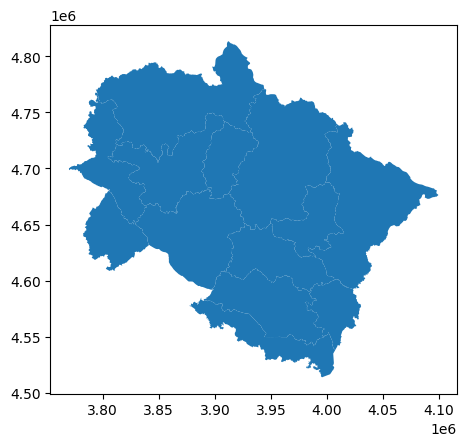

In [ ]:
gdf.plot()

# Reading Multi Layered File

In [ ]:
vector_file = '/content/drive/MyDrive/DLP_Data/GDB_File/Karimnagar_2020.gdb'

While reading file with multiple layers, first  list layers using geopandas.list_layers()

In [ ]:
layers = gpd.list_layers(vector_file)

In [ ]:
layers

,name,geometry_type
0,LULC_poly,MultiPolygon
1,Lines,MultiLineString


In [ ]:
lulc  = gpd.read_file(vector_file, layer='LULC_poly')

<Axes: >

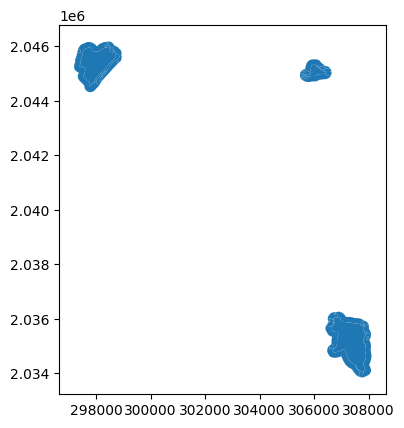

In [ ]:
lulc.plot()

In [ ]:
plt.close()

In [ ]:
df

,name,geometry_type
0,LULC_poly,MultiPolygon
1,Lines,MultiLineString


## Reading GeoJSON File

In [ ]:
gson = '/content/drive/MyDrive/DLP_Data/India/almora.geojson'
uk = gpd.read_file(gson)


In [ ]:
uk.head()

,District,STATE,REMARKS,State_LGD,DISTRICT_L,Shape_Leng,Shape_Area,geometry
0,ALMORA,UTTAR>KHAND,None,5,45,394957.247649,3.054452e+09,"POLYGON ((3928667.5795 4649016.8799, 3928702.4..."
1,B>GESHWAR,UTTAR>KHAND,None,5,46,315673.159842,2.173076e+09,"POLYGON ((3999849.4633 4687685.368, 4000178.13..."
2,CHAMP>WAT,UTTAR>KHAND,None,5,48,271591.235892,1.715187e+09,"POLYGON ((4010407.3561 4600633.3062, 4010490.8..."
3,DEHRAD@N,UTTAR>KHAND,None,5,49,503253.164310,3.019033e+09,"POLYGON ((3794571.8449 4767325.8049, 3794626.0..."
4,HARIDW>R,UTTAR>KHAND,None,5,50,287340.472634,2.225505e+09,"POLYGON ((3806475.6146 4680948.2938, 3806458.2..."


# Subsetting *GeoDataFrame* File

In [ ]:
file_name = '/content/drive/MyDrive/DLP_Data/India/MAJOR_TOWNS.shp'
gdf = gpd.read_file(file_name)

In [ ]:
subset = india[india['state']=='TAMIL NADU']

<Axes: >

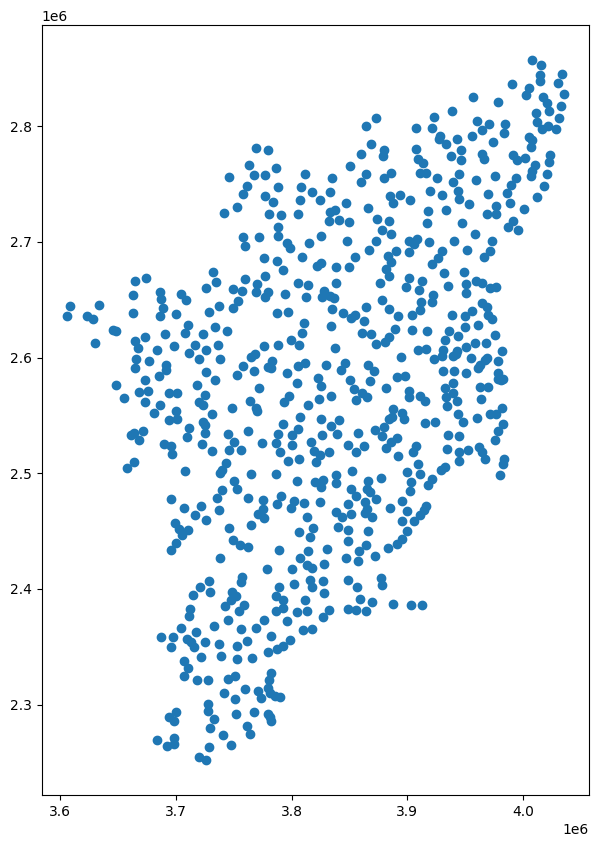

In [ ]:
subset.plot(figsize=(10, 10))

In [ ]:
subset.explore('district', legend=False)

In [ ]:
plt.close()

# Thank You